In [2]:
%pip install fredapi > /dev/null

Note: you may need to restart the kernel to use updated packages.


The system cannot find the path specified.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

plt.style.use('fivethirtyeight')

In [3]:
from fredapi import Fred

In [5]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [6]:
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

In [7]:
fred_key = '6b5964bda15256f3ad9e09f971e0b73f'

1. Create a fred object

In [8]:
fred = Fred(api_key=fred_key)

2. Search for economic data 

In [12]:
sp_search = fred.search('S&P',order_by='popularity')

In [13]:
sp_search.shape

(1000, 15)

In [14]:
sp_search.head(6)

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2023-02-21,2023-02-21,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2023-02-20,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2023-02-21 10:06:02-06:00,94,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2023-02-21,2023-02-21,S&P/Case-Shiller U.S. National Home Price Index,1987-01-01,2022-11-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2023-01-31 08:01:02-06:00,91,"For more information regarding the index, plea..."
SP500,SP500,2023-02-21,2023-02-21,S&P 500,2013-02-22,2023-02-21,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2023-02-21 19:10:56-06:00,84,The observations for the S&P 500 represent the...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2023-02-21,2023-02-21,ICE BofA US High Yield Index Effective Yield,1996-12-31,2023-02-20,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2023-02-21 10:06:07-06:00,84,This data represents the effective yield of th...
CSUSHPISA,CSUSHPISA,2023-02-21,2023-02-21,S&P/Case-Shiller U.S. National Home Price Index,1987-01-01,2022-11-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Seasonally Adjusted,SA,2023-01-31 08:01:04-06:00,82,"For more information regarding the index, plea..."
MEHOINUSA672N,MEHOINUSA672N,2023-02-21,2023-02-21,Real Median Household Income in the United States,1984-01-01,2021-01-01,Annual,A,2021 CPI-U-RS Adjusted Dollars,2021 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2022-09-13 13:48:01-05:00,81,Household data are collected as of March. As ...


3. Pull Raw Data 

<AxesSubplot:title={'center':'S&P 500'}>

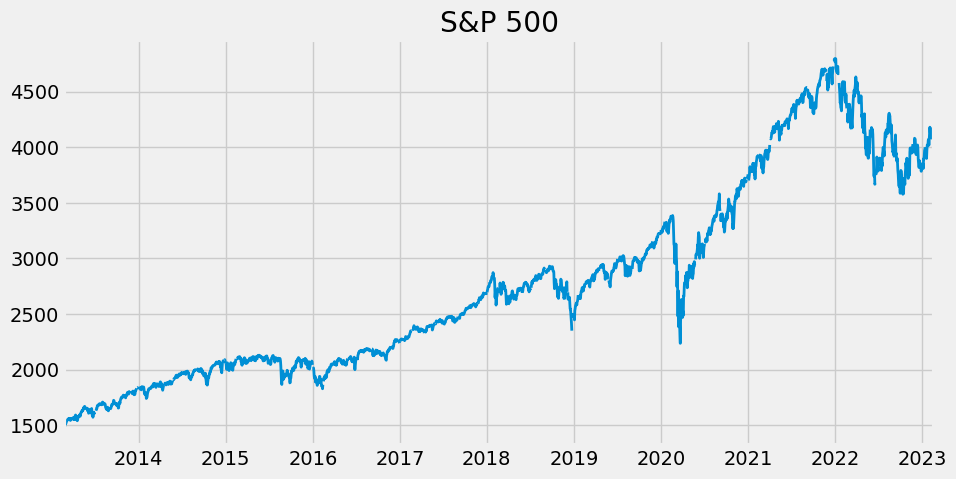

In [17]:
sp500 = fred.get_series(series_id='SP500')
sp500.plot(figsize=(10,5),title= "S&P 500", lw = 2)

4. Pull and join Multiple Data Series

In [18]:
unemp_res =fred.search('unemployment')
unemp_res

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2023-02-21,2023-02-21,Unemployment Rate,1948-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:02-06:00,94,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2023-02-21,2023-02-21,Unemployment Rate,1948-01-01,2023-01-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-02-03 07:43:02-06:00,60,The unemployment rate represents the number of...
NROU,NROU,2023-02-21,2023-02-21,Noncyclical Rate of Unemployment,1949-01-01,2032-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2022-05-26 13:45:04-05:00,69,"Starting with the July, 2021 report: An Update..."
UNEMPLOY,UNEMPLOY,2023-02-21,2023-02-21,Unemployment Level,1948-01-01,2023-01-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2023-02-03 07:44:05-06:00,70,The series comes from the 'Current Population ...
CCSA,CCSA,2023-02-21,2023-02-21,Continued Claims (Insured Unemployment),1967-01-07,2023-02-04,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2023-02-16 07:33:09-06:00,72,"Continued claims, also referred to as insured ..."
CCNSA,CCNSA,2023-02-21,2023-02-21,Continued Claims (Insured Unemployment),1967-01-07,2023-02-04,"Weekly, Ending Saturday",W,Number,Number,Not Seasonally Adjusted,NSA,2023-02-16 07:33:11-06:00,25,"Continued claims, also referred to as insured ..."
LNU03000000,LNU03000000,2023-02-21,2023-02-21,Unemployment Level,1948-01-01,2023-01-01,Monthly,M,Thousands of Persons,Thous. of Persons,Not Seasonally Adjusted,NSA,2023-02-03 07:44:32-06:00,28,The series comes from the 'Current Population ...
U6RATE,U6RATE,2023-02-21,2023-02-21,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:13-06:00,67,The series comes from the 'Current Population ...
LNS14000006,LNS14000006,2023-02-21,2023-02-21,Unemployment Rate - Black or African American,1972-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:12-06:00,66,The series comes from the 'Current Population ...


<AxesSubplot:title={'center':'UNEMPLOYMENT RATE'}>

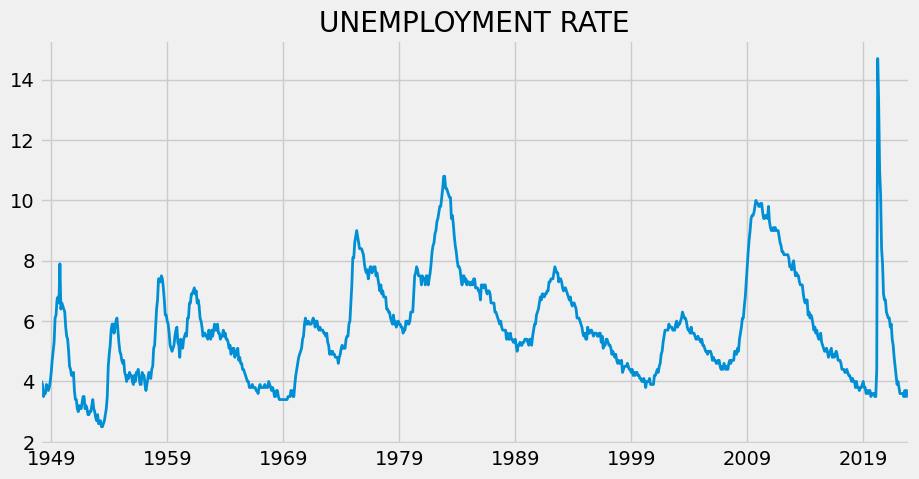

In [19]:
unrate = fred.get_series(series_id='UNRATE')
unrate.plot(figsize=(10,5),title= "UNEMPLOYMENT RATE", lw = 2)

5. get unemployment rate by states

In [24]:
unemp_df = fred.search('unemployment rate state', filter =('frequency', 'Monthly'))

In [25]:
unemp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2023-02-21,2023-02-21,Unemployment Rate,1948-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:02-06:00,94,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2023-02-21,2023-02-21,Unemployment Rate,1948-01-01,2023-01-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-02-03 07:43:02-06:00,60,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2023-02-21,2023-02-21,Unemployment Level,1948-01-01,2023-01-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2023-02-03 07:44:05-06:00,70,The series comes from the 'Current Population ...
LNS14000006,LNS14000006,2023-02-21,2023-02-21,Unemployment Rate - Black or African American,1972-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:12-06:00,66,The series comes from the 'Current Population ...
U6RATE,U6RATE,2023-02-21,2023-02-21,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2023-01-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-02-03 07:44:13-06:00,67,The series comes from the 'Current Population ...
LNU04000006,LNU04000006,2023-02-21,2023-02-21,Unemployment Rate - Black or African American,1972-01-01,2023-01-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-02-03 07:43:06-06:00,24,The series comes from the 'Current Population ...
U6RATENSA,U6RATENSA,2023-02-21,2023-02-21,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2023-01-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2023-02-03 07:43:18-06:00,11,The series comes from the 'Current Population ...
M0892AUSM156SNBR,M0892AUSM156SNBR,2023-02-21,2023-02-21,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,56,Series Is Presented Here As Three Variables--(...
CAUR,CAUR,2023-02-21,2023-02-21,Unemployment Rate in California,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:02-06:00,57,None


In [26]:
unemp_df.columns

Index(['id', 'realtime_start', 'realtime_end', 'title', 'observation_start',
       'observation_end', 'frequency', 'frequency_short', 'units',
       'units_short', 'seasonal_adjustment', 'seasonal_adjustment_short',
       'last_updated', 'popularity', 'notes'],
      dtype='object')

6. find monthly, seasonally adjusted unemployment Rate subset of data series from the current data frame

1) (168, 15)

2) save this subset data set as our data frame 

3) filter the data frame by 'title' column: got several different method to filter out the rows we don't want 
   i) str.contains(): more useful
   ii) filter lambda x: returns a iterable
   iii) map  lambda x: returns a iterable
   iv) apply lambda x: more useful

In [32]:
# len(list(filter(lambda x: 'Unemployment Rate' in x, unemp_df["title"])))
# sum(list(map(lambda x: 'Unemployment Rate' in x, unemp_df["title"])))
# unemp_df["title"].apply(lambda x:'Unemployment Rate' in x).sum(axis = 0)
# unemp_df["title"].str.contains('Unemployment Rate').sum()

101

In [48]:
unemp_df.loc[unemp_df["title"].str.contains('Unemployment Rate'),:].shape

(101, 15)

We got 101 rows satisfying out purpose

Let\' s Bring Them altogether so we don\'t get confused next time

In [53]:
unemp_df = fred.search('unemployment rate state', filter =('frequency', 'Monthly'))
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_df = unemp_df.loc[unemp_df["title"].str.contains('Unemployment Rate'),:]
unemp_df.shape

(101, 15)

7. go through each id and pull the each series data down

In [54]:
all_results = []

for myid in unemp_df.index:
    results = fred.get_series(series_id = myid)
    results = results.to_frame(name = myid)
    all_results.append(results)


In [55]:
len(all_results)

101

In [57]:
for i,d in enumerate(all_results):
    print(d.head(6))

            UNRATE
1948-01-01     3.4
1948-02-01     3.8
1948-03-01     4.0
1948-04-01     3.9
1948-05-01     3.5
1948-06-01     3.6
            LNS14000006
1972-01-01         11.2
1972-02-01         11.2
1972-03-01         10.7
1972-04-01          9.8
1972-05-01         10.2
1972-06-01         10.2
            M0892AUSM156SNBR
1929-04-01              0.69
1929-05-01              1.65
1929-06-01              2.06
1929-07-01              0.79
1929-08-01              0.04
1929-09-01              0.91
            CAUR
1976-01-01   9.2
1976-02-01   9.2
1976-03-01   9.1
1976-04-01   9.1
1976-05-01   9.0
1976-06-01   9.0
            M0892BUSM156SNBR
1940-01-01             15.53
1940-02-01               NaN
1940-03-01             15.03
1940-04-01             15.82
1940-05-01             15.50
1940-06-01             13.38
            LNS14000024
1948-01-01          3.0
1948-02-01          3.3
1948-03-01          3.5
1948-04-01          3.5
1948-05-01          3.3
1948-06-01          3.2
      

In [72]:
unemp_df["notes"]
# there are no series in our collected results needed to be dropped before the following analysis

series id
UNRATE                  The unemployment rate represents the number of...
LNS14000006             The series comes from the 'Current Population ...
M0892AUSM156SNBR        Series Is Presented Here As Three Variables--(...
CAUR                                                                 None
M0892BUSM156SNBR        Series Is Presented Here As Three Variables--(...
LNS14000024             The series comes from the 'Current Population ...
LNS14000031             The series comes from the 'Current Population ...
U2RATE                  The series comes from the 'Current Population ...
FLUR                                                                 None
LNS14000002             To obtain estimates of women worker employment...
TXUR                                                                 None
NYUR                                                                 None
LNS14000009             The series comes from the 'Current Population ...
LNS14000001             The 

In [85]:
# Concatenate all Series column-wise, pandas automatically fill the entry with no value with NaN
unemp_results = pd.concat(all_results,axis = 1)

8. we need to check the missing values and only plot series all have data during the same time points

Oh wait, I think I need to find unemployment rate data for different states, which I failed to get by only using the fred.search method

first let me find the series id where it has 'Unemployment Rate in' in its title

take a look at the last one, I don't think we need that

In [79]:
unemp_df.loc[unemp_df["title"].str.contains("Unemployment Rate in")].tail(1)["title"]
unemp_df.loc[unemp_df["title"].str.contains("Unemployment Rate in")].tail(1)["notes"]

series id
USAURAMS    Bureau of Labor Statistics (BLS) has eliminate...
Name: notes, dtype: object

Seems like this one has been discontinued, so we ignore that one

In [89]:
states_id = unemp_df.loc[unemp_df["title"].str.contains("Unemployment Rate in")].drop('USAURAMS',axis = 0)

In [90]:
states_id

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CAUR,CAUR,2023-02-21,2023-02-21,Unemployment Rate in California,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:02-06:00,57,None
FLUR,FLUR,2023-02-21,2023-02-21,Unemployment Rate in Florida,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:02-06:00,51,None
TXUR,TXUR,2023-02-21,2023-02-21,Unemployment Rate in Texas,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:26:03-06:00,49,None
NYUR,NYUR,2023-02-21,2023-02-21,Unemployment Rate in New York,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:26:02-06:00,47,None
OHUR,OHUR,2023-02-21,2023-02-21,Unemployment Rate in Ohio,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:26:04-06:00,41,None
MIUR,MIUR,2023-02-21,2023-02-21,Unemployment Rate in Michigan,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:02-06:00,38,None
PAUR,PAUR,2023-02-21,2023-02-21,Unemployment Rate in Pennsylvania,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:26:04-06:00,36,None
ALUR,ALUR,2023-02-21,2023-02-21,Unemployment Rate in Alabama,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:03-06:00,36,None
ILUR,ILUR,2023-02-21,2023-02-21,Unemployment Rate in Illinois,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-25 08:27:03-06:00,28,None


In [91]:
temp = {}
for myid in states_id.index:
    if myid in unemp_results.columns:
        temp[myid] = "yes"
    else:
        temp[myid] = "no"

In [96]:
sum(list(map(lambda x: x == "yes",temp.values())))

59

this means that we have all data available for us in current data set, don\'t need to make another search

get our subset data frame then

In [99]:
states_results = []

for myid in states_id.index:
    results = unemp_results[myid]
    results = results.to_frame(name = myid)
    states_results.append(results)

In [101]:
len(states_results)

59

In [104]:
unemp_results.shape

(1114, 101)

In [102]:
unemp_states = pd.concat(states_results, axis = 1)

In [103]:
unemp_states.shape

(1114, 59)

then we could continue on finding the missing value for each date

essentially it tells us when we started to record the unemployment rate montly for all the columns contained in the data frame

In [105]:
unemp_states.isna().sum(axis = 1)

1929-04-01    59
1929-05-01    59
1929-06-01    59
1929-07-01    59
1929-08-01    59
1929-09-01    59
1929-10-01    59
1929-11-01    59
1929-12-01    59
1930-01-01    59
1930-02-01    59
1930-03-01    59
1930-04-01    59
1930-05-01    59
1930-06-01    59
1930-07-01    59
1930-08-01    59
1930-09-01    59
1930-10-01    59
1930-11-01    59
1930-12-01    59
1931-01-01    59
1931-02-01    59
1931-03-01    59
1931-04-01    59
1931-05-01    59
1931-06-01    59
1931-07-01    59
1931-08-01    59
1931-09-01    59
1931-10-01    59
1931-11-01    59
1931-12-01    59
1932-01-01    59
1932-02-01    59
1932-03-01    59
1932-04-01    59
1932-05-01    59
1932-06-01    59
1932-07-01    59
1932-08-01    59
1932-09-01    59
1932-10-01    59
1932-11-01    59
1932-12-01    59
1933-01-01    59
1933-02-01    59
1933-03-01    59
1933-04-01    59
1933-05-01    59
1933-06-01    59
1933-07-01    59
1933-08-01    59
1933-09-01    59
1933-10-01    59
1933-11-01    59
1933-12-01    59
1934-01-01    59
1934-02-01    

<AxesSubplot:>

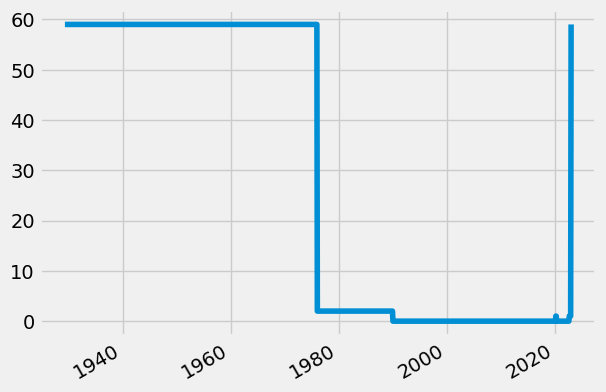

In [106]:
unemp_states.isna().sum(axis = 1).plot()

Seems like 1980 is the date since FRED started to provide monthly unemployment rate by states

Then we drop all NaNs

In [107]:
unemp_states = unemp_states.dropna()

In [108]:
unemp_states

,CAUR,FLUR,TXUR,NYUR,OHUR,MIUR,PAUR,ALUR,ILUR,TNUR,NCUR,COUR,AKUR,VAUR,MAUR,MNUR,KYUR,NJUR,WAUR,GAUR,WIUR,NMUR,WVUR,SCUR,AZUR,MOUR,ARUR,OKUR,ORUR,LASMT261982000000003,NVUR,INUR,IAUR,LAUR,MDUR,NDUR,UTUR,PRUR,HIUR,LASMT391746000000003,MSUR,DCUR,KSUR,NEUR,MTUR,IDUR,CTUR,MEUR,SDUR,VTUR,NHUR,RIUR,DEUR,WYUR,CNERUR,CMWRUR,CNEWUR,CSOUUR,CWSTUR
1990-01-01,5.2,5.8,6.3,5.2,6.0,7.7,5.2,6.7,6.3,5.0,3.5,5.2,7.2,3.9,5.3,4.6,5.8,4.5,5.4,5.2,4.2,6.7,8.1,4.7,5.0,5.6,6.7,5.4,5.1,7.6,4.4,5.1,4.4,6.1,3.7,4.2,4.5,14.3,2.6,4.8,7.5,5.1,4.1,2.5,5.7,5.3,4.3,4.5,3.7,4.0,4.5,5.4,3.5,5.5,5.0,5.6,4.9,5.4,5.2
1990-02-01,5.2,5.8,6.3,5.1,5.9,7.6,5.2,6.7,6.2,5.0,3.5,5.2,7.2,3.9,5.4,4.6,5.8,4.6,5.3,5.1,4.1,6.6,8.0,4.7,5.2,5.6,6.7,5.3,5.1,7.6,4.4,5.1,4.4,5.9,3.7,4.1,4.5,14.3,2.7,4.8,7.5,5.2,4.0,2.5,5.7,5.3,4.4,4.5,3.7,4.1,4.6,5.5,3.5,5.3,5.0,5.6,5.0,5.4,5.2
1990-03-01,5.2,5.9,6.3,5.1,5.7,7.5,5.2,6.7,6.1,5.0,3.5,5.1,7.2,3.9,5.6,4.6,5.7,4.6,5.2,5.1,4.1,6.5,8.0,4.7,5.3,5.5,6.7,5.2,5.1,7.5,4.3,5.0,4.3,5.8,3.7,4.1,4.4,14.2,2.7,4.7,7.4,5.3,4.0,2.4,5.6,5.4,4.5,4.5,3.7,4.2,4.8,5.7,3.5,5.2,5.0,5.5,5.1,5.4,5.2
1990-04-01,5.3,5.9,6.2,5.0,5.6,7.4,5.2,6.7,6.1,5.1,3.6,5.1,7.2,4.0,5.8,4.6,5.7,4.7,5.1,5.1,4.1,6.4,8.0,4.7,5.4,5.5,6.7,5.1,5.1,7.6,4.4,5.0,4.3,5.8,3.8,4.0,4.4,14.2,2.7,4.8,7.3,5.4,4.0,2.3,5.6,5.4,4.6,4.6,3.6,4.3,4.9,5.8,3.5,5.1,5.1,5.4,5.2,5.4,5.2
1990-05-01,5.4,6.0,6.3,5.0,5.6,7.4,5.2,6.7,6.1,5.1,3.7,5.1,7.2,4.1,6.0,4.6,5.7,4.7,5.1,5.2,4.1,6.4,8.1,4.7,5.4,5.5,6.7,5.0,5.2,7.6,4.4,5.0,4.3,5.8,3.9,4.0,4.3,14.1,2.7,4.8,7.2,5.6,4.1,2.3,5.8,5.5,4.7,4.7,3.6,4.5,5.1,6.0,3.5,5.0,5.1,5.4,5.4,5.5,5.3
1990-06-01,5.5,6.1,6.3,5.1,5.6,7.4,5.3,6.7,6.2,5.2,3.9,5.2,7.2,4.2,6.1,4.6,5.8,4.8,5.0,5.3,4.1,6.4,8.2,4.8,5.3,5.6,6.7,5.0,5.3,7.7,4.5,5.0,4.4,5.9,4.1,4.1,4.3,14.1,2.6,5.0,7.3,5.7,4.1,2.3,5.9,5.6,4.8,4.9,3.6,4.6,5.2,6.2,3.6,5.0,5.2,5.5,5.6,5.5,5.3
1990-07-01,5.7,6.2,6.3,5.1,5.6,7.5,5.4,6.8,6.3,5.3,4.0,5.2,7.2,4.4,6.4,4.7,5.9,5.0,5.0,5.3,4.2,6.5,8.5,4.9,5.3,5.8,6.8,5.2,5.5,7.8,4.6,4.9,4.4,6.1,4.3,4.1,4.3,14.1,2.6,5.2,7.3,5.9,4.2,2.3,6.0,5.6,4.9,5.2,3.6,4.7,5.3,6.3,3.7,5.0,5.3,5.5,5.7,5.7,5.4
1990-08-01,5.9,6.3,6.4,5.3,5.7,7.6,5.5,6.8,6.4,5.4,4.2,5.1,7.2,4.6,6.6,4.7,6.0,5.1,5.0,5.4,4.3,6.6,8.8,4.9,5.2,6.0,6.9,5.3,5.6,7.9,4.8,5.0,4.4,6.3,4.5,4.2,4.3,14.2,2.6,5.5,7.5,6.1,4.3,2.3,6.2,5.6,5.1,5.5,3.6,4.9,5.4,6.5,3.9,5.0,5.5,5.6,5.9,5.8,5.6
1990-09-01,6.1,6.5,6.4,5.5,5.7,7.7,5.7,6.9,6.4,5.5,4.5,5.1,7.3,4.7,6.9,4.8,6.2,5.4,5.0,5.5,4.5,6.8,9.1,5.0,5.2,6.2,7.0,5.5,5.7,8.1,4.9,5.0,4.5,6.5,4.7,4.2,4.3,14.4,2.5,5.7,7.7,6.4,4.4,2.4,6.3,5.7,5.2,5.8,3.6,5.0,5.6,6.6,5.5,5.1,5.7,5.7,6.1,5.9,5.7
1990-10-01,6.4,6.6,6.5,5.7,5.9,7.9,5.9,7.0,6.5,5.6,4.7,5.1,7.3,4.9,7.2,4.8,6.4,5.6,5.1,5.6,4.7,6.9,9.3,5.1,5.2,6.4,7.1,5.7,5.7,8.3,5.1,5.2,4.6,6.7,4.9,4.2,4.4,14.6,2.5,5.9,7.9,6.5,4.5,2.4,6.5,5.9,5.4,6.2,3.6,5.2,5.8,6.7,6.0,5.1,5.9,5.8,6.4,6.1,5.9


*Plot states Unemployment Rate* 

In [110]:
px.line(unemp_states)

Noticed there are a major jump in unemployment rate in May 2020

We could pull the data for all states at that date

## Pull May 2020 Unemployment Rate Per State

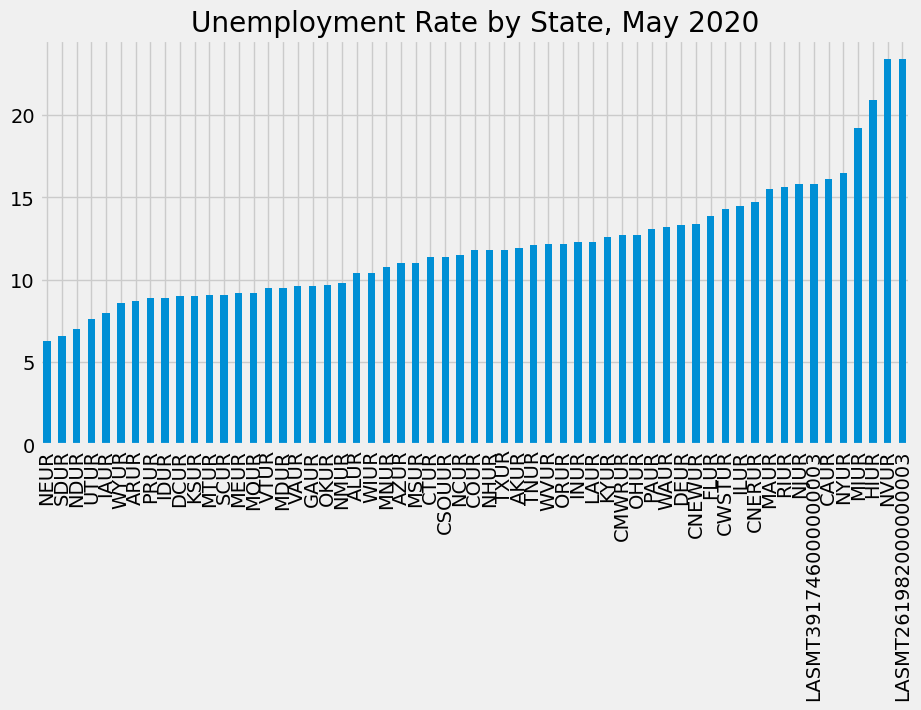

In [115]:
ax = unemp_states.loc[unemp_states.index == '2020-05-01'].T \
    .sort_values('2020-05-01') \
    .plot(kind = 'bar',figsize=(10,5),title = 'Unemployment Rate by State, May 2020')

ax.legend().remove()
plt.show()

This x-axis is not easy to comprehend, let\'s change them to the real state name

In [125]:
id_to_state = states_id['title'].str.replace('Unemployment Rate in ',"").to_dict()

In [126]:
id_to_state

{'CAUR': 'California',
 'FLUR': 'Florida',
 'TXUR': 'Texas',
 'NYUR': 'New York',
 'OHUR': 'Ohio',
 'MIUR': 'Michigan',
 'PAUR': 'Pennsylvania',
 'ALUR': 'Alabama',
 'ILUR': 'Illinois',
 'TNUR': 'Tennessee',
 'NCUR': 'North Carolina',
 'COUR': 'Colorado',
 'AKUR': 'Alaska',
 'VAUR': 'Virginia',
 'MAUR': 'Massachusetts',
 'MNUR': 'Minnesota',
 'KYUR': 'Kentucky',
 'NJUR': 'New Jersey',
 'WAUR': 'Washington',
 'GAUR': 'Georgia',
 'WIUR': 'Wisconsin',
 'NMUR': 'New Mexico',
 'WVUR': 'West Virginia',
 'SCUR': 'South Carolina',
 'AZUR': 'Arizona',
 'MOUR': 'Missouri',
 'ARUR': 'Arkansas',
 'OKUR': 'Oklahoma',
 'ORUR': 'Oregon',
 'LASMT261982000000003': 'Detroit-Warren-Dearborn, MI (MSA)',
 'NVUR': 'Nevada',
 'INUR': 'Indiana',
 'IAUR': 'Iowa',
 'LAUR': 'Louisiana',
 'MDUR': 'Maryland',
 'NDUR': 'North Dakota',
 'UTUR': 'Utah',
 'PRUR': 'Puerto Rico',
 'HIUR': 'Hawaii',
 'LASMT391746000000003': 'Cleveland-Elyria, OH (MSA)',
 'MSUR': 'Mississippi',
 'DCUR': 'the District of Columbia',
 'KSUR'

Then we need to change the columns names of this df to the values we have in id_to_state

Use distionary comprehension

In [130]:
unemp_states.columns = [id_to_state[ele] for ele in unemp_states.columns]

In [131]:
unemp_states.columns

Index(['California', 'Florida', 'Texas', 'New York', 'Ohio', 'Michigan',
       'Pennsylvania', 'Alabama', 'Illinois', 'Tennessee', 'North Carolina',
       'Colorado', 'Alaska', 'Virginia', 'Massachusetts', 'Minnesota',
       'Kentucky', 'New Jersey', 'Washington', 'Georgia', 'Wisconsin',
       'New Mexico', 'West Virginia', 'South Carolina', 'Arizona', 'Missouri',
       'Arkansas', 'Oklahoma', 'Oregon', 'Detroit-Warren-Dearborn, MI (MSA)',
       'Nevada', 'Indiana', 'Iowa', 'Louisiana', 'Maryland', 'North Dakota',
       'Utah', 'Puerto Rico', 'Hawaii', 'Cleveland-Elyria, OH (MSA)',
       'Mississippi', 'the District of Columbia', 'Kansas', 'Nebraska',
       'Montana', 'Idaho', 'Connecticut', 'Maine', 'South Dakota', 'Vermont',
       'New Hampshire', 'Rhode Island', 'Delaware', 'Wyoming',
       'Northeast Census Region', 'Midwest Census Region',
       'New England Census Division', 'South Census Region',
       'West Census Region'],
      dtype='object')

OR...Just call the values and make it a list

In [129]:
list(id_to_state.values())

['California',
 'Florida',
 'Texas',
 'New York',
 'Ohio',
 'Michigan',
 'Pennsylvania',
 'Alabama',
 'Illinois',
 'Tennessee',
 'North Carolina',
 'Colorado',
 'Alaska',
 'Virginia',
 'Massachusetts',
 'Minnesota',
 'Kentucky',
 'New Jersey',
 'Washington',
 'Georgia',
 'Wisconsin',
 'New Mexico',
 'West Virginia',
 'South Carolina',
 'Arizona',
 'Missouri',
 'Arkansas',
 'Oklahoma',
 'Oregon',
 'Detroit-Warren-Dearborn, MI (MSA)',
 'Nevada',
 'Indiana',
 'Iowa',
 'Louisiana',
 'Maryland',
 'North Dakota',
 'Utah',
 'Puerto Rico',
 'Hawaii',
 'Cleveland-Elyria, OH (MSA)',
 'Mississippi',
 'the District of Columbia',
 'Kansas',
 'Nebraska',
 'Montana',
 'Idaho',
 'Connecticut',
 'Maine',
 'South Dakota',
 'Vermont',
 'New Hampshire',
 'Rhode Island',
 'Delaware',
 'Wyoming',
 'Northeast Census Region',
 'Midwest Census Region',
 'New England Census Division',
 'South Census Region',
 'West Census Region']

In [132]:
unemp_states

,California,Florida,Texas,New York,Ohio,Michigan,Pennsylvania,Alabama,Illinois,Tennessee,North Carolina,Colorado,Alaska,Virginia,Massachusetts,Minnesota,Kentucky,New Jersey,Washington,Georgia,Wisconsin,New Mexico,West Virginia,South Carolina,Arizona,Missouri,Arkansas,Oklahoma,Oregon,"Detroit-Warren-Dearborn, MI (MSA)",Nevada,Indiana,Iowa,Louisiana,Maryland,North Dakota,Utah,Puerto Rico,Hawaii,"Cleveland-Elyria, OH (MSA)",Mississippi,the District of Columbia,Kansas,Nebraska,Montana,Idaho,Connecticut,Maine,South Dakota,Vermont,New Hampshire,Rhode Island,Delaware,Wyoming,Northeast Census Region,Midwest Census Region,New England Census Division,South Census Region,West Census Region
1990-01-01,5.2,5.8,6.3,5.2,6.0,7.7,5.2,6.7,6.3,5.0,3.5,5.2,7.2,3.9,5.3,4.6,5.8,4.5,5.4,5.2,4.2,6.7,8.1,4.7,5.0,5.6,6.7,5.4,5.1,7.6,4.4,5.1,4.4,6.1,3.7,4.2,4.5,14.3,2.6,4.8,7.5,5.1,4.1,2.5,5.7,5.3,4.3,4.5,3.7,4.0,4.5,5.4,3.5,5.5,5.0,5.6,4.9,5.4,5.2
1990-02-01,5.2,5.8,6.3,5.1,5.9,7.6,5.2,6.7,6.2,5.0,3.5,5.2,7.2,3.9,5.4,4.6,5.8,4.6,5.3,5.1,4.1,6.6,8.0,4.7,5.2,5.6,6.7,5.3,5.1,7.6,4.4,5.1,4.4,5.9,3.7,4.1,4.5,14.3,2.7,4.8,7.5,5.2,4.0,2.5,5.7,5.3,4.4,4.5,3.7,4.1,4.6,5.5,3.5,5.3,5.0,5.6,5.0,5.4,5.2
1990-03-01,5.2,5.9,6.3,5.1,5.7,7.5,5.2,6.7,6.1,5.0,3.5,5.1,7.2,3.9,5.6,4.6,5.7,4.6,5.2,5.1,4.1,6.5,8.0,4.7,5.3,5.5,6.7,5.2,5.1,7.5,4.3,5.0,4.3,5.8,3.7,4.1,4.4,14.2,2.7,4.7,7.4,5.3,4.0,2.4,5.6,5.4,4.5,4.5,3.7,4.2,4.8,5.7,3.5,5.2,5.0,5.5,5.1,5.4,5.2
1990-04-01,5.3,5.9,6.2,5.0,5.6,7.4,5.2,6.7,6.1,5.1,3.6,5.1,7.2,4.0,5.8,4.6,5.7,4.7,5.1,5.1,4.1,6.4,8.0,4.7,5.4,5.5,6.7,5.1,5.1,7.6,4.4,5.0,4.3,5.8,3.8,4.0,4.4,14.2,2.7,4.8,7.3,5.4,4.0,2.3,5.6,5.4,4.6,4.6,3.6,4.3,4.9,5.8,3.5,5.1,5.1,5.4,5.2,5.4,5.2
1990-05-01,5.4,6.0,6.3,5.0,5.6,7.4,5.2,6.7,6.1,5.1,3.7,5.1,7.2,4.1,6.0,4.6,5.7,4.7,5.1,5.2,4.1,6.4,8.1,4.7,5.4,5.5,6.7,5.0,5.2,7.6,4.4,5.0,4.3,5.8,3.9,4.0,4.3,14.1,2.7,4.8,7.2,5.6,4.1,2.3,5.8,5.5,4.7,4.7,3.6,4.5,5.1,6.0,3.5,5.0,5.1,5.4,5.4,5.5,5.3
1990-06-01,5.5,6.1,6.3,5.1,5.6,7.4,5.3,6.7,6.2,5.2,3.9,5.2,7.2,4.2,6.1,4.6,5.8,4.8,5.0,5.3,4.1,6.4,8.2,4.8,5.3,5.6,6.7,5.0,5.3,7.7,4.5,5.0,4.4,5.9,4.1,4.1,4.3,14.1,2.6,5.0,7.3,5.7,4.1,2.3,5.9,5.6,4.8,4.9,3.6,4.6,5.2,6.2,3.6,5.0,5.2,5.5,5.6,5.5,5.3
1990-07-01,5.7,6.2,6.3,5.1,5.6,7.5,5.4,6.8,6.3,5.3,4.0,5.2,7.2,4.4,6.4,4.7,5.9,5.0,5.0,5.3,4.2,6.5,8.5,4.9,5.3,5.8,6.8,5.2,5.5,7.8,4.6,4.9,4.4,6.1,4.3,4.1,4.3,14.1,2.6,5.2,7.3,5.9,4.2,2.3,6.0,5.6,4.9,5.2,3.6,4.7,5.3,6.3,3.7,5.0,5.3,5.5,5.7,5.7,5.4
1990-08-01,5.9,6.3,6.4,5.3,5.7,7.6,5.5,6.8,6.4,5.4,4.2,5.1,7.2,4.6,6.6,4.7,6.0,5.1,5.0,5.4,4.3,6.6,8.8,4.9,5.2,6.0,6.9,5.3,5.6,7.9,4.8,5.0,4.4,6.3,4.5,4.2,4.3,14.2,2.6,5.5,7.5,6.1,4.3,2.3,6.2,5.6,5.1,5.5,3.6,4.9,5.4,6.5,3.9,5.0,5.5,5.6,5.9,5.8,5.6
1990-09-01,6.1,6.5,6.4,5.5,5.7,7.7,5.7,6.9,6.4,5.5,4.5,5.1,7.3,4.7,6.9,4.8,6.2,5.4,5.0,5.5,4.5,6.8,9.1,5.0,5.2,6.2,7.0,5.5,5.7,8.1,4.9,5.0,4.5,6.5,4.7,4.2,4.3,14.4,2.5,5.7,7.7,6.4,4.4,2.4,6.3,5.7,5.2,5.8,3.6,5.0,5.6,6.6,5.5,5.1,5.7,5.7,6.1,5.9,5.7
1990-10-01,6.4,6.6,6.5,5.7,5.9,7.9,5.9,7.0,6.5,5.6,4.7,5.1,7.3,4.9,7.2,4.8,6.4,5.6,5.1,5.6,4.7,6.9,9.3,5.1,5.2,6.4,7.1,5.7,5.7,8.3,5.1,5.2,4.6,6.7,4.9,4.2,4.4,14.6,2.5,5.9,7.9,6.5,4.5,2.4,6.5,5.9,5.4,6.2,3.6,5.2,5.8,6.7,6.0,5.1,5.9,5.8,6.4,6.1,5.9


Okay, the df has been modified as the way we want

Do The Data Visualization Again

In [133]:
px.line(unemp_states)

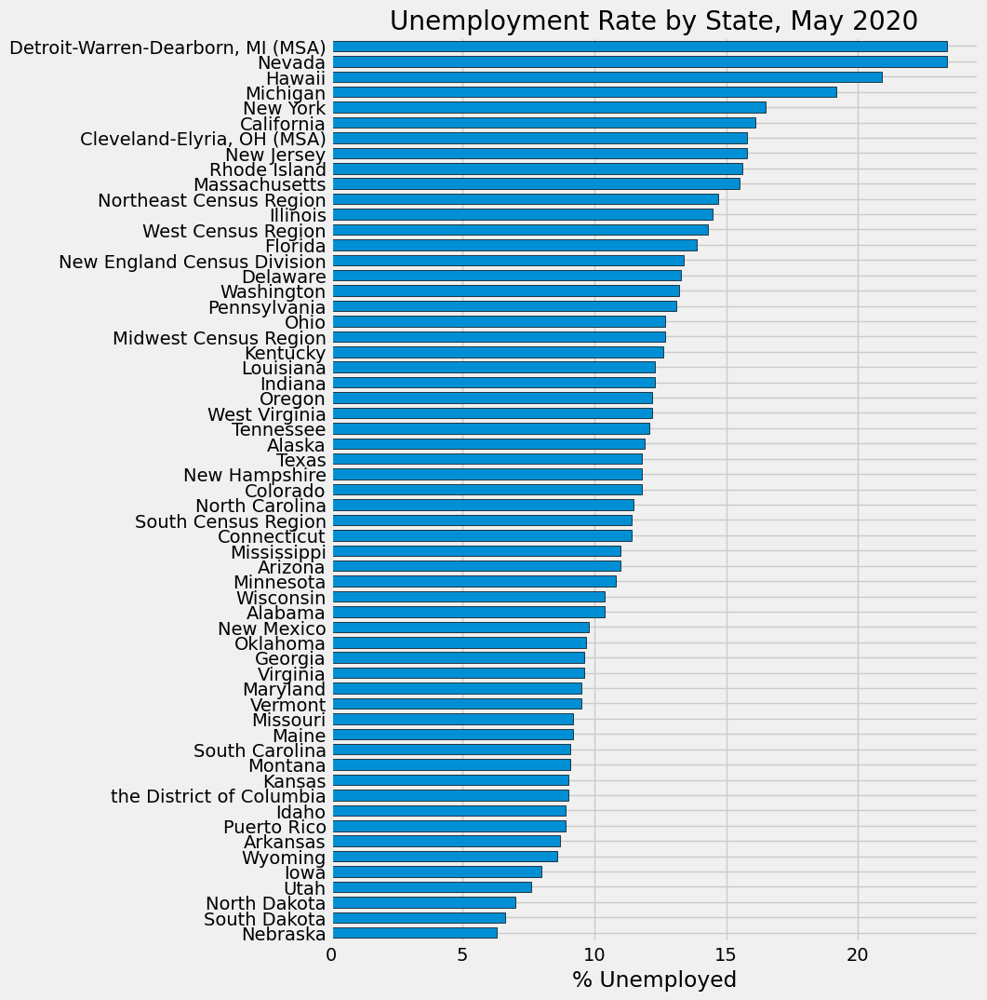

In [138]:
# Make a horizontal bar plot
ax = unemp_states.loc[unemp_states.index == '2020-05-01'].T \
    .sort_values('2020-05-01') \
    .plot(kind = 'barh',figsize=(8,12),width = 0.7, edgecolor = 'black',
          title = 'Unemployment Rate by State, May 2020')

ax.legend().remove()
ax.set_xlabel('% Unemployed')
plt.show()

# Pull the Participation Rate as another metric to refer

In [161]:
part_df = fred.search('participation rate state', filter =('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')


In [163]:
# we only want part rate fpr state
part_df = part_df.loc[part_df["title"].str.contains('Participation Rate for'),:]
part_df.shape

(51, 15)

In [164]:
# We also need to change columns names to the real state name
part_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
LBSSA06,LBSSA06,2023-02-22,2023-02-22,Labor Force Participation Rate for California,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:04-06:00,22,A state's labor-force participation rate is th...
LBSSA01,LBSSA01,2023-02-22,2023-02-22,Labor Force Participation Rate for Alabama,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:07-06:00,11,A state's labor-force participation rate is th...
LBSSA21,LBSSA21,2023-02-22,2023-02-22,Labor Force Participation Rate for Kentucky,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:04-06:00,27,A state's labor-force participation rate is th...
LBSSA12,LBSSA12,2023-02-22,2023-02-22,Labor Force Participation Rate for Florida,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:03-06:00,26,A state's labor-force participation rate is th...
LBSSA55,LBSSA55,2023-02-22,2023-02-22,Labor Force Participation Rate for Wisconsin,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:02-06:00,24,A state's labor-force participation rate is th...
LBSSA26,LBSSA26,2023-02-22,2023-02-22,Labor Force Participation Rate for Michigan,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:04-06:00,23,A state's labor-force participation rate is th...
LBSSA27,LBSSA27,2023-02-22,2023-02-22,Labor Force Participation Rate for Minnesota,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:01-06:00,24,A state's labor-force participation rate is th...
LBSSA39,LBSSA39,2023-02-22,2023-02-22,Labor Force Participation Rate for Ohio,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:09-06:00,14,A state's labor-force participation rate is th...
LBSSA48,LBSSA48,2023-02-22,2023-02-22,Labor Force Participation Rate for Texas,1976-01-01,2022-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-01-24 09:01:05-06:00,21,A state's labor-force participation rate is th...


In [165]:
part_id_to_state = part_df['title'].str.replace("Labor Force Participation Rate for ","").to_dict()
part_id_to_state

{'LBSSA06': 'California',
 'LBSSA01': 'Alabama',
 'LBSSA21': 'Kentucky',
 'LBSSA12': 'Florida',
 'LBSSA55': 'Wisconsin',
 'LBSSA26': 'Michigan',
 'LBSSA27': 'Minnesota',
 'LBSSA39': 'Ohio',
 'LBSSA48': 'Texas',
 'LBSSA37': 'North Carolina',
 'LBSSA25': 'Massachusetts',
 'LBSSA36': 'New York',
 'LBSSA47': 'Tennessee',
 'LBSSA35': 'New Mexico',
 'LBSSA13': 'Georgia',
 'LBSSA08': 'Colorado',
 'LBSSA15': 'Hawaii',
 'LBSSA54': 'West Virginia',
 'LBSSA24': 'Maryland',
 'LBSSA23': 'Maine',
 'LBSSA17': 'Illinois',
 'LBSSA28': 'Mississippi',
 'LBSSA19': 'Iowa',
 'LBSSA49': 'Utah',
 'LBSSA22': 'Louisiana',
 'LBSSA32': 'Nevada',
 'LBSSA18': 'Indiana',
 'LBSSA41': 'Oregon',
 'LBSSA42': 'Pennsylvania',
 'LBSSA04': 'Arizona',
 'LBSSA31': 'Nebraska',
 'LBSSA29': 'Missouri',
 'LBSSA46': 'South Dakota',
 'LBSSA34': 'New Jersey',
 'LBSSA45': 'South Carolina',
 'LBSSA33': 'New Hampshire',
 'LBSSA53': 'Washington',
 'LBSSA51': 'Virginia',
 'LBSSA09': 'Connecticut',
 'LBSSA40': 'Oklahoma',
 'LBSSA16': 'Ida

then we pull down the data and store into the list like we did before

In [166]:
part_results = []

for myid in part_df.index:
    results = fred.get_series(series_id = myid)
    results = results.to_frame(name = myid)
    part_results.append(results)

In [167]:
len(part_results)

51

In [168]:
part_states= pd.concat(part_results,axis = 1)

In [169]:
part_states

,LBSSA06,LBSSA01,LBSSA21,LBSSA12,LBSSA55,LBSSA26,LBSSA27,LBSSA39,LBSSA48,LBSSA37,LBSSA25,LBSSA36,LBSSA47,LBSSA35,LBSSA13,LBSSA08,LBSSA15,LBSSA54,LBSSA24,LBSSA23,LBSSA17,LBSSA28,LBSSA19,LBSSA49,LBSSA22,LBSSA32,LBSSA18,LBSSA41,LBSSA42,LBSSA04,LBSSA31,LBSSA29,LBSSA46,LBSSA34,LBSSA45,LBSSA33,LBSSA53,LBSSA51,LBSSA09,LBSSA40,LBSSA16,LBSSA30,LBSSA02,LBSSA38,LBSSA05,LBSSA20,LBSSA50,LBSSA56,LBSSA10,LBSSA44,LBSSA11
1976-01-01,62.6,57.0,60.5,55.8,65.6,61.6,65.6,61.7,63.8,66.5,64.8,58.0,59.6,60.8,63.7,67.2,69.9,52.5,64.3,62.1,63.0,58.8,64.4,62.8,56.8,71.3,64.0,62.9,58.4,59.5,64.9,60.5,64.6,61.5,65.3,65.9,60.9,65.9,64.2,59.3,63.0,62.7,69.0,62.6,57.9,65.1,63.6,65.3,62.7,63.8,64.4
1976-02-01,62.4,56.9,60.3,55.7,65.5,61.5,65.5,61.7,63.5,66.3,64.7,58.0,59.4,60.5,63.6,67.0,69.6,52.4,64.2,61.9,63.0,58.6,64.3,62.6,56.6,70.8,63.9,62.7,58.3,59.2,64.9,60.3,64.4,61.4,65.2,65.6,60.7,65.8,64.1,59.2,62.8,62.5,68.4,62.4,57.8,65.0,63.4,64.9,62.5,63.7,64.5
1976-03-01,62.2,56.8,60.2,55.5,65.4,61.5,65.4,61.7,63.4,66.2,64.6,58.0,59.3,60.3,63.5,66.8,69.6,52.3,64.1,61.9,62.9,58.5,64.2,62.5,56.5,70.5,63.8,62.5,58.3,59.1,64.8,60.3,64.4,61.4,65.0,65.6,60.6,65.6,64.0,59.1,62.7,62.4,67.8,62.3,57.7,64.9,63.2,64.7,62.5,63.6,64.5
1976-04-01,62.2,56.8,60.1,55.5,65.4,61.6,65.4,61.6,63.5,66.2,64.6,58.0,59.3,60.3,63.5,66.6,69.4,52.3,64.1,61.8,62.9,58.5,64.1,62.5,56.4,70.4,63.8,62.4,58.3,59.1,64.8,60.4,64.3,61.5,64.9,65.7,60.6,65.5,64.1,59.0,62.7,62.3,67.9,62.5,57.7,65.0,63.5,64.9,62.4,63.7,64.5
1976-05-01,62.3,56.8,60.1,55.4,65.5,61.7,65.5,61.6,63.6,66.3,64.6,58.1,59.4,60.3,63.6,66.5,69.3,52.2,64.1,61.7,63.0,58.5,64.1,62.6,56.4,70.5,63.9,62.5,58.3,59.1,64.8,60.6,64.3,61.6,64.7,66.0,60.7,65.4,64.3,59.0,62.8,62.2,67.9,62.6,57.7,65.1,63.6,65.2,62.4,63.6,64.4
1976-06-01,62.4,56.9,60.1,55.4,65.6,61.8,65.7,61.5,63.8,66.3,64.7,58.1,59.5,60.3,63.7,66.4,69.3,52.0,64.2,61.8,63.0,58.5,64.2,62.8,56.5,70.7,64.0,62.6,58.3,59.3,64.9,60.8,64.5,61.7,64.7,66.3,61.0,65.4,64.5,58.9,63.1,62.1,68.3,62.7,57.7,65.3,63.8,65.5,62.5,63.5,64.3
1976-07-01,62.5,56.9,60.0,55.3,65.7,61.9,65.8,61.4,63.9,66.3,64.8,58.2,59.7,60.4,63.9,66.4,69.2,51.8,64.3,61.6,63.0,58.5,64.2,63.0,56.6,70.8,64.1,62.9,58.3,59.4,65.1,61.0,64.6,61.8,64.6,66.6,61.4,65.3,64.6,58.9,63.2,62.2,68.3,62.9,57.8,65.4,63.8,65.8,62.5,63.4,64.1
1976-08-01,62.6,57.0,60.0,55.2,65.8,61.9,66.0,61.4,63.9,66.2,64.9,58.2,59.9,60.4,63.9,66.5,69.1,51.5,64.3,61.6,63.0,58.5,64.2,63.0,56.6,71.0,64.2,63.2,58.3,59.6,65.2,61.2,64.7,61.8,64.5,66.7,61.7,65.3,64.6,58.9,63.4,62.2,68.5,63.0,57.8,65.6,63.7,65.9,62.5,63.3,64.0
1976-09-01,62.7,57.1,59.9,55.1,65.9,61.9,66.1,61.3,63.9,66.2,64.9,58.1,60.0,60.5,64.0,66.6,68.9,51.3,64.4,61.4,62.9,58.5,64.3,63.0,56.6,70.9,64.2,63.4,58.3,59.7,65.3,61.3,64.8,61.9,64.5,66.7,62.0,65.3,64.5,58.9,63.5,62.4,68.8,63.2,57.8,65.7,63.5,66.0,62.7,63.2,64.0
1976-10-01,62.8,57.1,59.8,55.0,65.9,61.9,66.2,61.3,63.8,66.1,64.9,58.1,60.2,60.5,64.1,66.8,68.9,51.1,64.4,61.4,62.9,58.6,64.4,63.0,56.6,71.0,64.1,63.6,58.3,59.8,65.4,61.4,64.8,61.9,64.4,66.7,62.2,65.3,64.4,58.9,63.7,62.5,68.8,63.1,57.8,65.7,63.6,66.1,62.7,63.2,63.9


In [170]:
part_states.columns = list(part_id_to_state.values())

In [171]:
part_states

,California,Alabama,Kentucky,Florida,Wisconsin,Michigan,Minnesota,Ohio,Texas,North Carolina,Massachusetts,New York,Tennessee,New Mexico,Georgia,Colorado,Hawaii,West Virginia,Maryland,Maine,Illinois,Mississippi,Iowa,Utah,Louisiana,Nevada,Indiana,Oregon,Pennsylvania,Arizona,Nebraska,Missouri,South Dakota,New Jersey,South Carolina,New Hampshire,Washington,Virginia,Connecticut,Oklahoma,Idaho,Montana,Alaska,North Dakota,Arkansas,Kansas,Vermont,Wyoming,Delaware,Rhode Island,District Of Columbia
1976-01-01,62.6,57.0,60.5,55.8,65.6,61.6,65.6,61.7,63.8,66.5,64.8,58.0,59.6,60.8,63.7,67.2,69.9,52.5,64.3,62.1,63.0,58.8,64.4,62.8,56.8,71.3,64.0,62.9,58.4,59.5,64.9,60.5,64.6,61.5,65.3,65.9,60.9,65.9,64.2,59.3,63.0,62.7,69.0,62.6,57.9,65.1,63.6,65.3,62.7,63.8,64.4
1976-02-01,62.4,56.9,60.3,55.7,65.5,61.5,65.5,61.7,63.5,66.3,64.7,58.0,59.4,60.5,63.6,67.0,69.6,52.4,64.2,61.9,63.0,58.6,64.3,62.6,56.6,70.8,63.9,62.7,58.3,59.2,64.9,60.3,64.4,61.4,65.2,65.6,60.7,65.8,64.1,59.2,62.8,62.5,68.4,62.4,57.8,65.0,63.4,64.9,62.5,63.7,64.5
1976-03-01,62.2,56.8,60.2,55.5,65.4,61.5,65.4,61.7,63.4,66.2,64.6,58.0,59.3,60.3,63.5,66.8,69.6,52.3,64.1,61.9,62.9,58.5,64.2,62.5,56.5,70.5,63.8,62.5,58.3,59.1,64.8,60.3,64.4,61.4,65.0,65.6,60.6,65.6,64.0,59.1,62.7,62.4,67.8,62.3,57.7,64.9,63.2,64.7,62.5,63.6,64.5
1976-04-01,62.2,56.8,60.1,55.5,65.4,61.6,65.4,61.6,63.5,66.2,64.6,58.0,59.3,60.3,63.5,66.6,69.4,52.3,64.1,61.8,62.9,58.5,64.1,62.5,56.4,70.4,63.8,62.4,58.3,59.1,64.8,60.4,64.3,61.5,64.9,65.7,60.6,65.5,64.1,59.0,62.7,62.3,67.9,62.5,57.7,65.0,63.5,64.9,62.4,63.7,64.5
1976-05-01,62.3,56.8,60.1,55.4,65.5,61.7,65.5,61.6,63.6,66.3,64.6,58.1,59.4,60.3,63.6,66.5,69.3,52.2,64.1,61.7,63.0,58.5,64.1,62.6,56.4,70.5,63.9,62.5,58.3,59.1,64.8,60.6,64.3,61.6,64.7,66.0,60.7,65.4,64.3,59.0,62.8,62.2,67.9,62.6,57.7,65.1,63.6,65.2,62.4,63.6,64.4
1976-06-01,62.4,56.9,60.1,55.4,65.6,61.8,65.7,61.5,63.8,66.3,64.7,58.1,59.5,60.3,63.7,66.4,69.3,52.0,64.2,61.8,63.0,58.5,64.2,62.8,56.5,70.7,64.0,62.6,58.3,59.3,64.9,60.8,64.5,61.7,64.7,66.3,61.0,65.4,64.5,58.9,63.1,62.1,68.3,62.7,57.7,65.3,63.8,65.5,62.5,63.5,64.3
1976-07-01,62.5,56.9,60.0,55.3,65.7,61.9,65.8,61.4,63.9,66.3,64.8,58.2,59.7,60.4,63.9,66.4,69.2,51.8,64.3,61.6,63.0,58.5,64.2,63.0,56.6,70.8,64.1,62.9,58.3,59.4,65.1,61.0,64.6,61.8,64.6,66.6,61.4,65.3,64.6,58.9,63.2,62.2,68.3,62.9,57.8,65.4,63.8,65.8,62.5,63.4,64.1
1976-08-01,62.6,57.0,60.0,55.2,65.8,61.9,66.0,61.4,63.9,66.2,64.9,58.2,59.9,60.4,63.9,66.5,69.1,51.5,64.3,61.6,63.0,58.5,64.2,63.0,56.6,71.0,64.2,63.2,58.3,59.6,65.2,61.2,64.7,61.8,64.5,66.7,61.7,65.3,64.6,58.9,63.4,62.2,68.5,63.0,57.8,65.6,63.7,65.9,62.5,63.3,64.0
1976-09-01,62.7,57.1,59.9,55.1,65.9,61.9,66.1,61.3,63.9,66.2,64.9,58.1,60.0,60.5,64.0,66.6,68.9,51.3,64.4,61.4,62.9,58.5,64.3,63.0,56.6,70.9,64.2,63.4,58.3,59.7,65.3,61.3,64.8,61.9,64.5,66.7,62.0,65.3,64.5,58.9,63.5,62.4,68.8,63.2,57.8,65.7,63.5,66.0,62.7,63.2,64.0
1976-10-01,62.8,57.1,59.8,55.0,65.9,61.9,66.2,61.3,63.8,66.1,64.9,58.1,60.2,60.5,64.1,66.8,68.9,51.1,64.4,61.4,62.9,58.6,64.4,63.0,56.6,71.0,64.1,63.6,58.3,59.8,65.4,61.4,64.8,61.9,64.4,66.7,62.2,65.3,64.4,58.9,63.7,62.5,68.8,63.1,57.8,65.7,63.6,66.1,62.7,63.2,63.9


Plot the Unemployment rate VS Participation rate

Plot the Unem rate vs Part rate by state over 2020 -- 2022

In [184]:
import matplotlib.ticker as plticker

In [186]:
import matplotlib.dates as pldates

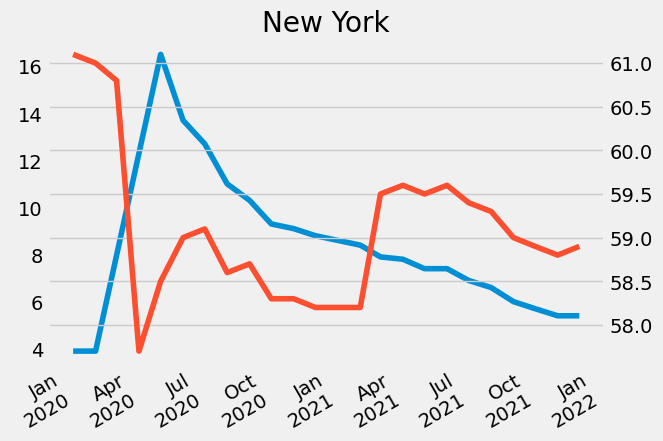

<Figure size 2000x600 with 0 Axes>

In [218]:
fig, ax = plt.subplots()
ax2 = ax.twinx()

ax.plot(unemp_states.query('index >= 2020 and index < 2022')['New York'] \
         , label = "Unemployment")

ax2.plot(part_states.query('index >= 2020 and index < 2022')['New York'] \
              , label = "Participation", color = color_pal[1])

# fig.subplots_adjust(bottom=)
loc = pldates.MonthLocator((1,4,7,10))
ax.xaxis.set_major_locator(loc)
ax.xaxis.set_major_formatter(pldates.DateFormatter("%b\n%Y"))
ax.grid(False)
ax.set_title('New York')
plt.gcf().autofmt_xdate()
# plt.xticks(rotation=90)
plt.figure(figsize = (20,6))
plt.show()

Below method doesn\'t work

In [ ]:


# fig, ax = plt.subplots()
# ax2 = ax.twinx()

# unemp_states.query('index >= 2020 and index < 2022')['New York'] \
#     .plot(ax = ax, label = "Unemployment")

# part_states.query('index >= 2020 and index < 2022')['New York'] \
#     .plot(ax = ax2, label = "Participation")



Then we plot that for each state

In [222]:
unemp_states.columns

Index(['California', 'Florida', 'Texas', 'New York', 'Ohio', 'Michigan',
       'Pennsylvania', 'Alabama', 'Illinois', 'Tennessee', 'North Carolina',
       'Colorado', 'Alaska', 'Virginia', 'Massachusetts', 'Minnesota',
       'Kentucky', 'New Jersey', 'Washington', 'Georgia', 'Wisconsin',
       'New Mexico', 'West Virginia', 'South Carolina', 'Arizona', 'Missouri',
       'Arkansas', 'Oklahoma', 'Oregon', 'Detroit-Warren-Dearborn, MI (MSA)',
       'Nevada', 'Indiana', 'Iowa', 'Louisiana', 'Maryland', 'North Dakota',
       'Utah', 'Puerto Rico', 'Hawaii', 'Cleveland-Elyria, OH (MSA)',
       'Mississippi', 'the District of Columbia', 'Kansas', 'Nebraska',
       'Montana', 'Idaho', 'Connecticut', 'Maine', 'South Dakota', 'Vermont',
       'New Hampshire', 'Rhode Island', 'Delaware', 'Wyoming',
       'Northeast Census Region', 'Midwest Census Region',
       'New England Census Division', 'South Census Region',
       'West Census Region'],
      dtype='object')

In [220]:
part_states.columns

Index(['California', 'Alabama', 'Kentucky', 'Florida', 'Wisconsin', 'Michigan',
       'Minnesota', 'Ohio', 'Texas', 'North Carolina', 'Massachusetts',
       'New York', 'Tennessee', 'New Mexico', 'Georgia', 'Colorado', 'Hawaii',
       'West Virginia', 'Maryland', 'Maine', 'Illinois', 'Mississippi', 'Iowa',
       'Utah', 'Louisiana', 'Nevada', 'Indiana', 'Oregon', 'Pennsylvania',
       'Arizona', 'Nebraska', 'Missouri', 'South Dakota', 'New Jersey',
       'South Carolina', 'New Hampshire', 'Washington', 'Virginia',
       'Connecticut', 'Oklahoma', 'Idaho', 'Montana', 'Alaska', 'North Dakota',
       'Arkansas', 'Kansas', 'Vermont', 'Wyoming', 'Delaware', 'Rhode Island',
       'District Of Columbia'],
      dtype='object')

In [224]:
dic = {}
for ele in part_states.columns:
    if ele in unemp_states.columns:
        dic[ele] = "yes"
    else:
        dic[ele] = "No"

In [228]:
list(dic.values()).index("No")

50

In [229]:
list(dic.keys())[50]

'District Of Columbia'

we realized that there is a mismatch between the column names in two dfs

Let me rename that column

In [231]:
unemp_states = unemp_states.rename(columns={'the District of Columbia': 'District Of Columbia'})

In [232]:
unemp_states.columns

Index(['California', 'Florida', 'Texas', 'New York', 'Ohio', 'Michigan',
       'Pennsylvania', 'Alabama', 'Illinois', 'Tennessee', 'North Carolina',
       'Colorado', 'Alaska', 'Virginia', 'Massachusetts', 'Minnesota',
       'Kentucky', 'New Jersey', 'Washington', 'Georgia', 'Wisconsin',
       'New Mexico', 'West Virginia', 'South Carolina', 'Arizona', 'Missouri',
       'Arkansas', 'Oklahoma', 'Oregon', 'Detroit-Warren-Dearborn, MI (MSA)',
       'Nevada', 'Indiana', 'Iowa', 'Louisiana', 'Maryland', 'North Dakota',
       'Utah', 'Puerto Rico', 'Hawaii', 'Cleveland-Elyria, OH (MSA)',
       'Mississippi', 'District Of Columbia', 'Kansas', 'Nebraska', 'Montana',
       'Idaho', 'Connecticut', 'Maine', 'South Dakota', 'Vermont',
       'New Hampshire', 'Rhode Island', 'Delaware', 'Wyoming',
       'Northeast Census Region', 'Midwest Census Region',
       'New England Census Division', 'South Census Region',
       'West Census Region'],
      dtype='object')

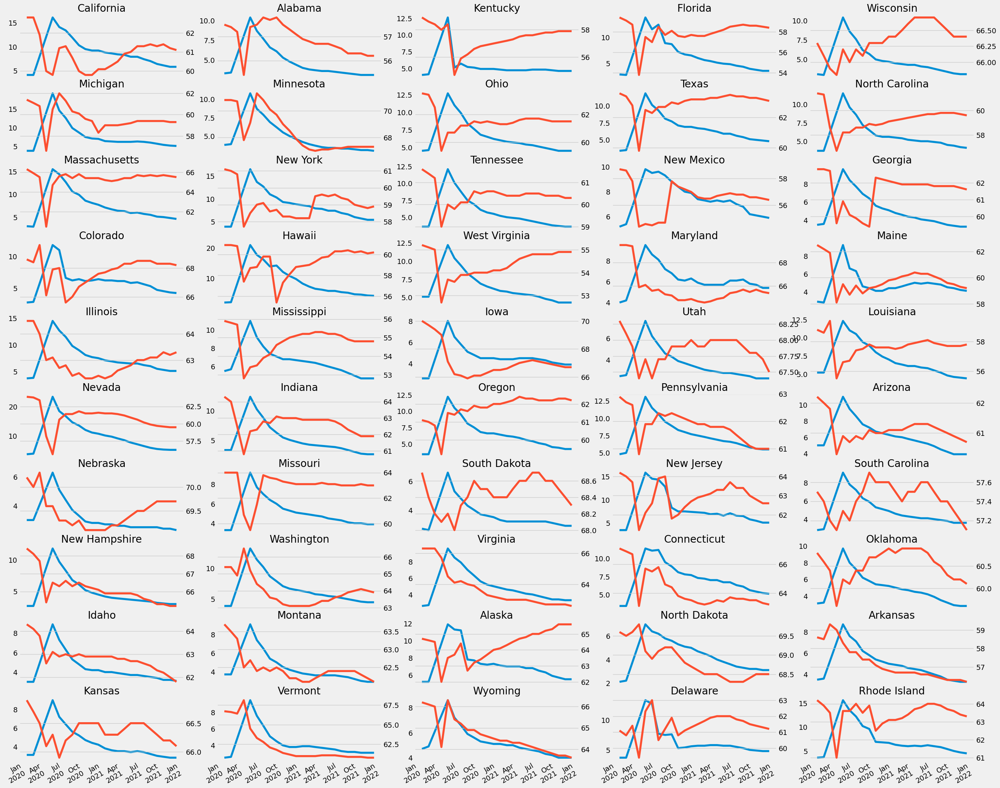

<Figure size 2000x600 with 0 Axes>

In [233]:
fig, axs = plt.subplots(10,5,figsize = (30,30),sharex=True)
axs = axs.flatten()

i = 0

for state in part_states.columns:
    if state == 'District Of Columbia':
        continue
    
    ax = axs[i]
    ax2 = ax.twinx()

    ax.plot(unemp_states.query('index >= 2020 and index < 2022')[state] \
            , label = "Unemployment")

    ax2.plot(part_states.query('index >= 2020 and index < 2022')[state] \
                , label = "Participation", color = color_pal[1])

# fig.subplots_adjust(bottom=)
    loc = pldates.MonthLocator((1,4,7,10))
    ax.xaxis.set_major_locator(loc)
    ax.xaxis.set_major_formatter(pldates.DateFormatter("%b\n%Y"))
    ax.grid(False)
    ax.set_title(state)
    i += 1

plt.gcf().autofmt_xdate()
# plt.xticks(rotation=90)
plt.figure(figsize = (20,6))
plt.show()



In [237]:
unemp_states.index

DatetimeIndex(['1990-01-01', '1990-02-01', '1990-03-01', '1990-04-01',
               '1990-05-01', '1990-06-01', '1990-07-01', '1990-08-01',
               '1990-09-01', '1990-10-01',
               ...
               '2021-11-01', '2021-12-01', '2022-01-01', '2022-02-01',
               '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01',
               '2022-07-01', '2022-08-01'],
              dtype='datetime64[ns]', length=390, freq=None)